In [1]:
!pip install -U gdown

In [2]:
!gdown --id 1KXx1CW-BM3muxzCtmyhyv9xtWco_nDbL --output dataset.zip
!unzip dataset.zip

Streaming output truncated to the last 5000 lines.
  inflating: Comys_Hackathon5/Task_B/train/Luc_Montagnier/distortion/Luc_Montagnier_0001_lowlight.jpg  
  inflating: Comys_Hackathon5/Task_B/train/Luc_Montagnier/distortion/Luc_Montagnier_0001_foggy.jpg  
  inflating: Comys_Hackathon5/Task_B/train/Luc_Montagnier/distortion/Luc_Montagnier_0001_blurred.jpg  
   creating: Comys_Hackathon5/Task_B/train/Lucy_Liu/distortion/
  inflating: Comys_Hackathon5/Task_B/train/Lucy_Liu/distortion/Lucy_Liu_0005_sunny.jpg  
  inflating: Comys_Hackathon5/Task_B/train/Lucy_Liu/distortion/Lucy_Liu_0005_resized.jpg  
  inflating: Comys_Hackathon5/Task_B/train/Lucy_Liu/distortion/Lucy_Liu_0005_rainy.jpg  
  inflating: Comys_Hackathon5/Task_B/train/Lucy_Liu/distortion/Lucy_Liu_0005_noisy.jpg  
  inflating: Comys_Hackathon5/Task_B/train/Lucy_Liu/distortion/Lucy_Liu_0005_lowlight.jpg  
  inflating: Comys_Hackathon5/Task_B/train/Lucy_Liu/distortion/Lucy_Liu_0005_foggy.jpg  
  inflating: Comys_Hackathon5/Task_B/t

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
import os

def count_images_in_directory(directory):
    """Counts the number of image files (jpg, jpeg, png) in a directory and its subdirectories."""
    image_count = 0
    for root, _, files in os.walk(directory):
        for file in files:
            if file.lower().endswith(('.jpg', '.jpeg', '.png')):
                image_count += 1
    return image_count

dataset_path = '/content/Comys_Hackathon5'
subdirectories = {
    'train_male': os.path.join(dataset_path, 'Task_A', 'train', 'male'),
    'train_female': os.path.join(dataset_path, 'Task_A', 'train', 'female'),
    'val_male': os.path.join(dataset_path, 'Task_A', 'val', 'male'),
    'val_female': os.path.join(dataset_path, 'Task_A', 'val', 'female'),
}

image_counts = {}
for name, path in subdirectories.items():
    if os.path.exists(path):
        image_counts[name] = count_images_in_directory(path)
    else:
        image_counts[name] = f"Directory not found: {path}"

for name, count in image_counts.items():
    print(f"{name}: {count}")

train_male: 1532
train_female: 394
val_male: 317
val_female: 105


In [5]:
import os

def count_images_in_directory(directory):
    """Counts the number of image files (jpg, jpeg, png) in a directory."""
    image_count = 0
    if os.path.exists(directory):
        for file in os.listdir(directory):
            if file.lower().endswith(('.jpg', '.jpeg', '.png')):
                image_count += 1
    return image_count

taskB_train_path = os.path.join('/content/Comys_Hackathon5', 'Task_B', 'train')

distortion_counts_per_person = {}

if os.path.exists(taskB_train_path):
    for person_name in os.listdir(taskB_train_path):
        person_dir = os.path.join(taskB_train_path, person_name)
        if os.path.isdir(person_dir):
            distortion_dir = os.path.join(person_dir, 'distortion')
            if os.path.exists(distortion_dir) and os.path.isdir(distortion_dir):
                distortion_counts_per_person[person_name] = count_images_in_directory(distortion_dir)

print("Distortion Image Counts per Person in Task B Training Data:")
for name, count in distortion_counts_per_person.items():
    print(f"{name}: {count}")

Distortion Image Counts per Person in Task B Training Data:
095_frontal: 7
Nelson_Shanks: 7
Gregg_Popovich: 35
Brian_Scalabrine: 7
Wan_Yanhai: 7
David_Modell: 7
Jean-Pierre_Bemba: 7
Trisha_Meili: 7
Roger_Staubach: 7
Allen_Rock: 7
Luc_Montagnier: 7
Uzi_Even: 7
011_frontal: 7
Jon_Gruden: 49
Paulina_Rodriguez_Davila: 7
Roman_Tam: 7
Steve_Austin: 7
Jennifer_Furminger: 7
Scott_McNealy: 14
118_frontal: 7
Patricia_Johnson: 7
Jason_Biggs: 7
121_frontal: 7
Bill_Kollar: 7
Hideki_Sato: 7
Ty_Votaw: 7
Al_Leiter: 7
082_frontal: 7
Kurt_Warner: 35
Oscar_De_La_Hoya: 49
James_Mathis: 7
Deena_Burnett: 7
022_frontal: 7
Shane_Mosley: 14
Rita_Moreno: 14
James_Lockhart: 7
William_Burns: 14
117_frontal: 7
Li_Peng: 63
Hussam_Mohammed_Amin: 7
Steve_Mariucci: 21
Alejandro_Atchugarry: 14
Tom_Hanks: 70
Roger_Clemens: 14
S_Jayakumar: 14
Al_Gore: 56
Peter_Harvey: 7
Jacqueline_Obradors: 14
Jolanta_Kwasniewski: 14
Dave_Robertson: 7
057_frontal: 7
Paul_Li_Calsi: 7
Jeong_Se-hyun: 63
Atiabet_Ijan_Amabel: 7
Alan_Tang_Kwon

--- Task A Samples ---
--- Task A - Train Male ---


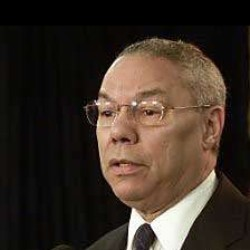

--- Task A - Train Female ---


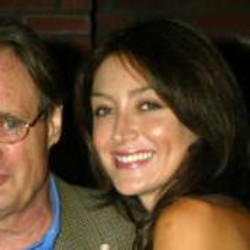

--- Task A - Validation Male ---


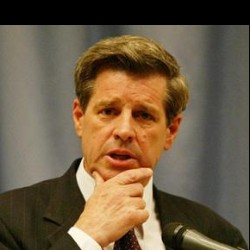

--- Task A - Validation Female ---


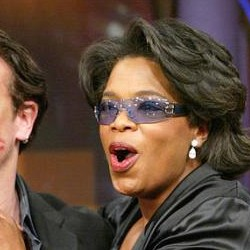


--- Task B Samples ---
--- Task B - Train Original (Kellie_Coffey) ---


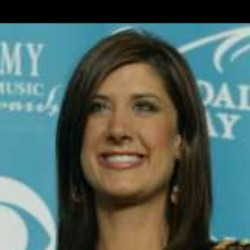

--- Task B - Train Distortion (Kellie_Coffey) ---


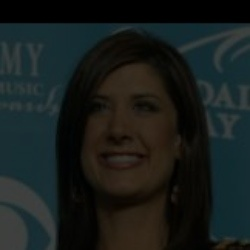

In [6]:
import os
import random
from IPython.display import display, Image

def display_random_image_from_directory(directory, title):
    """Displays a random image from the specified directory."""
    if os.path.exists(directory):
        image_files = [f for f in os.listdir(directory) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
        if image_files:
            random_image_file = random.choice(image_files)
            random_image_path = os.path.join(directory, random_image_file)
            print(f"--- {title} ---")
            display(Image(filename=random_image_path))
        else:
            print(f"No image files found in {directory}")
    else:
        print(f"Directory not found: {directory}")

dataset_path = '/content/Comys_Hackathon5'

print("--- Task A Samples ---")
display_random_image_from_directory(os.path.join(dataset_path, 'Task_A', 'train', 'male'), "Task A - Train Male")
display_random_image_from_directory(os.path.join(dataset_path, 'Task_A', 'train', 'female'), "Task A - Train Female")
display_random_image_from_directory(os.path.join(dataset_path, 'Task_A', 'val', 'male'), "Task A - Validation Male")
display_random_image_from_directory(os.path.join(dataset_path, 'Task_A', 'val', 'female'), "Task A - Validation Female")


print("\n--- Task B Samples ---")
taskB_train_path = os.path.join(dataset_path, 'Task_B', 'train')
if os.path.exists(taskB_train_path):
    person_dirs = [os.path.join(taskB_train_path, d) for d in os.listdir(taskB_train_path) if os.path.isdir(os.path.join(taskB_train_path, d))]
    if person_dirs:
        random_person_dir = random.choice(person_dirs)
        person_name = os.path.basename(random_person_dir)

        display_random_image_from_directory(random_person_dir, f"Task B - Train Original ({person_name})")

        distortion_dir = os.path.join(random_person_dir, 'distortion')
        display_random_image_from_directory(distortion_dir, f"Task B - Train Distortion ({person_name})")
    else:
        print(f"No person directories found in {taskB_train_path}")
else:
    print(f"Directory not found: {taskB_train_path}")

--- Task B Distortion Samples (Multiple People) ---
--- Task B - Train Distortion (068_frontal) ---


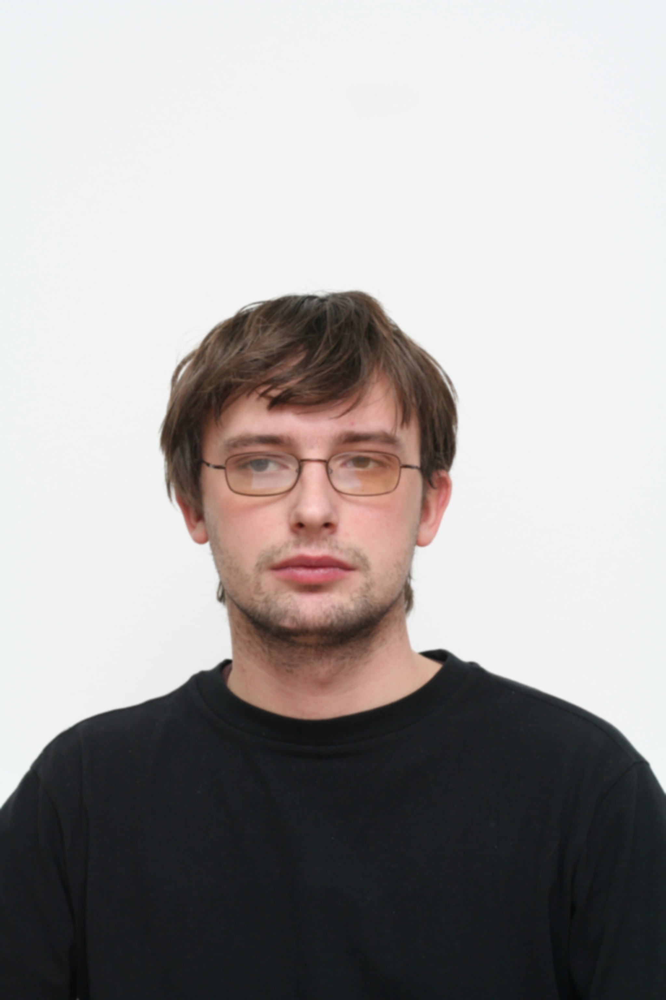

--- Task B - Train Distortion (Magda_Kertasz) ---


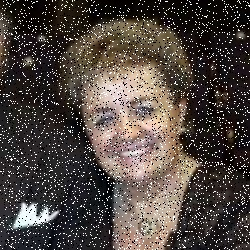

--- Task B - Train Distortion (051_frontal) ---


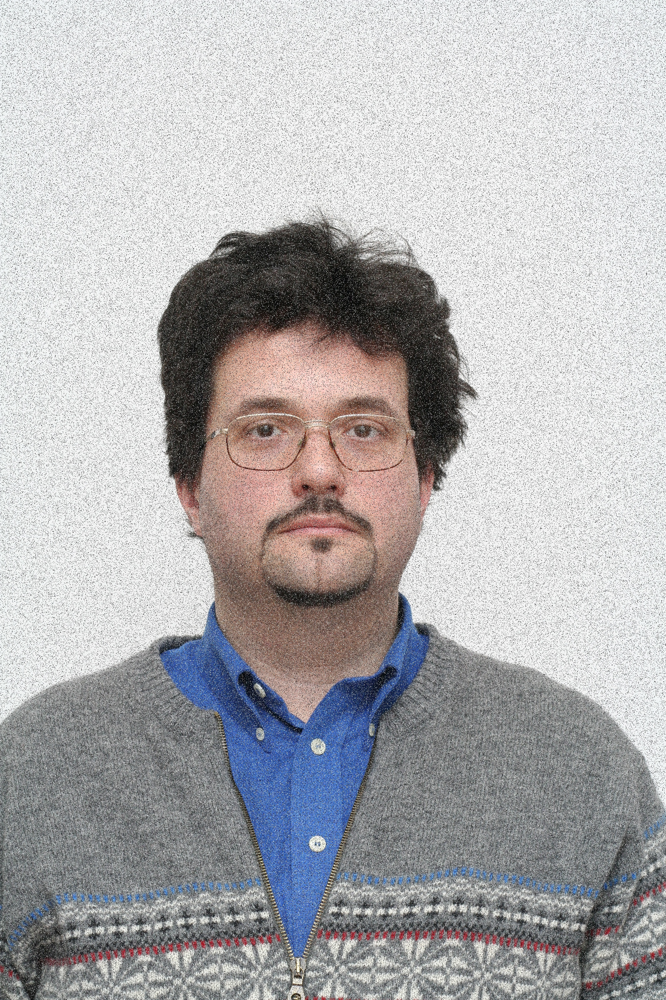

--- Task B - Train Distortion (Dan_Wheldon) ---


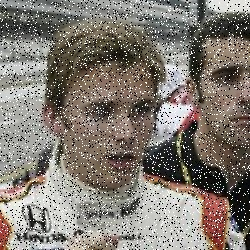

--- Task B - Train Distortion (Alfredo_Pena) ---


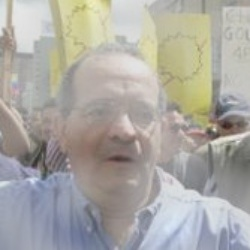

In [7]:
import os
import random
from IPython.display import display, Image

def display_random_image_from_directory(directory, title):
    """Displays a random image from the specified directory."""
    if os.path.exists(directory):
        image_files = [f for f in os.listdir(directory) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
        if image_files:
            random_image_file = random.choice(image_files)
            random_image_path = os.path.join(directory, random_image_file)
            print(f"--- {title} ---")
            display(Image(filename=random_image_path))
        else:
            print(f"No image files found in {directory}")
    else:
        print(f"Directory not found: {directory}")

dataset_path = '/content/Comys_Hackathon5'
taskB_train_path = os.path.join(dataset_path, 'Task_B', 'train')

print("--- Task B Distortion Samples (Multiple People) ---")

if os.path.exists(taskB_train_path):
    person_dirs = [os.path.join(taskB_train_path, d) for d in os.listdir(taskB_train_path) if os.path.isdir(os.path.join(taskB_train_path, d))]

    if person_dirs:
        # Select a few random people to display
        num_people_to_display = min(5, len(person_dirs)) # Display up to 5 people
        people_to_display = random.sample(person_dirs, num_people_to_display)

        for person_dir in people_to_display:
            person_name = os.path.basename(person_dir)
            distortion_dir = os.path.join(person_dir, 'distortion')
            display_random_image_from_directory(distortion_dir, f"Task B - Train Distortion ({person_name})")
    else:
        print(f"No person directories found in {taskB_train_path}")
else:
    print(f"Directory not found: {taskB_train_path}")

In [8]:
!pip install albumentations

In [9]:
import os
from sklearn.model_selection import train_test_split
import shutil

dataset_path = '/content/Comys_Hackathon5'
task_a_train_dir = os.path.join(dataset_path, 'Task_A', 'train')
task_a_test_dir = os.path.join(dataset_path, 'Task_A', 'test')

os.makedirs(os.path.join(task_a_test_dir, 'male'), exist_ok=True)
os.makedirs(os.path.join(task_a_test_dir, 'female'), exist_ok=True)

image_paths_a = []
labels_a = []

for gender in ['male', 'female']:
    gender_dir = os.path.join(task_a_train_dir, gender)
    if os.path.exists(gender_dir):
        for img_name in os.listdir(gender_dir):
            if img_name.lower().endswith(('.jpg', '.jpeg', '.png')):
                image_paths_a.append(os.path.join(gender_dir, img_name))
                labels_a.append(gender)

train_paths_a, test_paths_a, train_labels_a, test_labels_a = train_test_split(
    image_paths_a, labels_a, test_size=0.2, random_state=42, stratify=labels_a
)

print("Moving Task A test images...")
for img_path, label in zip(test_paths_a, test_labels_a):
    img_name = os.path.basename(img_path)
    destination_dir = os.path.join(task_a_test_dir, label)
    shutil.move(img_path, os.path.join(destination_dir, img_name))

print(f"Task A: Split complete. {len(train_paths_a)} images in new training set, {len(test_paths_a)} images in new test set.")

Moving Task A test images...
Task A: Split complete. 1540 images in new training set, 386 images in new test set.


Original Image:


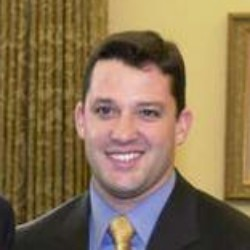


Applying Augmentations Individually:
Resized Image:


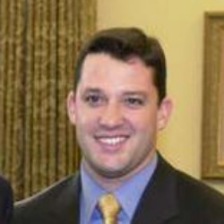

Blurred Image:


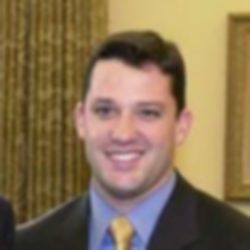

Gauss Noise Image:


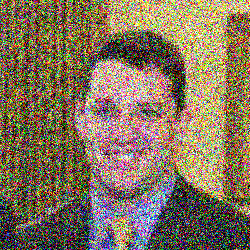

Brightness/Contrast Adjusted Image:


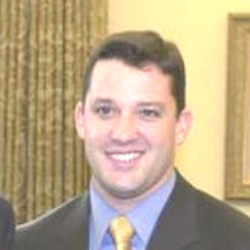

Rainy Image:


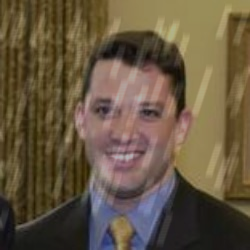

Foggy Image:


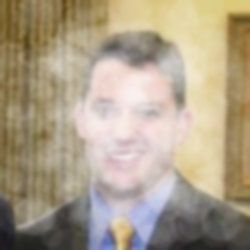

In [10]:
from albumentations import (
    Compose,
    Blur,
    GaussNoise,
    Resize,
    RandomBrightnessContrast,
    RandomRain,
    RandomFog,
    ToFloat,
    Normalize
)
import cv2
import os
import random
from IPython.display import display, Image

# Define individual augmentations for demonstration
resize_aug = Resize(height=224, width=224, p=1.0)
blur_aug = Blur(blur_limit=7, p=1.0) # Set p=1.0 to always apply for demonstration
gauss_noise_aug = GaussNoise(p=1.0) # Set p=1.0 to always apply for demonstration
brightness_contrast_aug = RandomBrightnessContrast(brightness_limit=0.4, contrast_limit=0.4, p=1.0) # Increased limits for visibility
rain_aug = RandomRain(p=1.0) # Set p=1.0 to always apply for demonstration
fog_aug = RandomFog(p=1.0) # Set p=1.0 to always apply for demonstration

# Get a sample image path from the training data
dataset_path = '/content/Comys_Hackathon5'
task_a_train_male_dir = os.path.join(dataset_path, 'Task_A', 'train', 'male')
if os.path.exists(task_a_train_male_dir):
    image_files = [f for f in os.listdir(task_a_train_male_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    if image_files:
        sample_image_path = os.path.join(task_a_train_male_dir, random.choice(image_files))

        # Load the sample image
        sample_image = cv2.imread(sample_image_path)
        sample_image = cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB) # Convert to RGB for display

        if sample_image is not None:
            print("Original Image:")
            display(Image(data=cv2.imencode('.png', cv2.cvtColor(sample_image, cv2.COLOR_RGB2BGR))[1].tobytes()))

            # Apply and display each augmentation individually
            print("\nApplying Augmentations Individually:")

            # Resize
            resized_image = resize_aug(image=sample_image)['image']
            print("Resized Image:")
            display(Image(data=cv2.imencode('.png', cv2.cvtColor(resized_image, cv2.COLOR_RGB2BGR))[1].tobytes()))

            # Blur
            blurred_image = blur_aug(image=sample_image)['image']
            print("Blurred Image:")
            display(Image(data=cv2.imencode('.png', cv2.cvtColor(blurred_image, cv2.COLOR_RGB2BGR))[1].tobytes()))

            # Gauss Noise
            noise_image = gauss_noise_aug(image=sample_image)['image']
            print("Gauss Noise Image:")
            display(Image(data=cv2.imencode('.png', cv2.cvtColor(noise_image, cv2.COLOR_RGB2BGR))[1].tobytes()))

            # Brightness Contrast
            bright_contrast_image = brightness_contrast_aug(image=sample_image)['image']
            print("Brightness/Contrast Adjusted Image:")
            display(Image(data=cv2.imencode('.png', cv2.cvtColor(bright_contrast_image, cv2.COLOR_RGB2BGR))[1].tobytes()))

            # Rain
            rainy_image = rain_aug(image=sample_image)['image']
            print("Rainy Image:")
            display(Image(data=cv2.imencode('.png', cv2.cvtColor(rainy_image, cv2.COLOR_RGB2BGR))[1].tobytes()))

            # Fog
            foggy_image = fog_aug(image=sample_image)['image']
            print("Foggy Image:")
            display(Image(data=cv2.imencode('.png', cv2.cvtColor(foggy_image, cv2.COLOR_RGB2BGR))[1].tobytes()))

        else:
            print("Could not load sample image.")
    else:
        print("No image files found in the sample directory.")
else:
    print("Sample directory not found.")

# The full augmentation pipeline remains here for later use
augmentation_pipeline = Compose([
    Resize(height=224, width=224, p=1.0),
    Blur(blur_limit=7, p=0.5),
    GaussNoise(p=0.5),
    RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.5),
    RandomRain(p=0.3),
    RandomFog(p=0.3),
    Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToFloat(max_value=255.0)
])

In [11]:
import torch
import torch.nn as nn
import torchvision.models as models

class GenderClassificationModel(nn.Module):
    def __init__(self, num_classes=1):
        super(GenderClassificationModel, self).__init__()
        self.backbone = models.resnet50(pretrained=True)

        num_ftrs = self.backbone.fc.in_features
        self.backbone.fc = nn.Identity()

        self.classification_head = nn.Linear(num_ftrs, num_classes)

    def forward(self, x):
        x = self.backbone(x)
        x = self.classification_head(x)
        return x



In [12]:
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import CosineAnnealingWarmRestarts, LambdaLR
import numpy as np

criterion = nn.BCEWithLogitsLoss()


class EarlyStopping:
    """Early stops the training if validation metric doesn't improve after a given patience."""
    def __init__(self, patience=7, verbose=False, delta=0.001, path='checkpoint.pt', trace_func=print):
        """
        Args:
            patience (int): How long to wait after last time validation metric improved.
                            Default: 7
            verbose (bool): If True, prints a message for each validation metric improvement.
                            Default: False
            delta (float): Minimum change in the monitored metric to qualify as an improvement.
                           Default: 0.001 (as per the protocol)
            path (str): Path for the checkpoint to be saved to.
                        Default: 'checkpoint.pt'
            trace_func (function): trace print function.
                                   Default: print
        """
        self.patience = patience
        self.verbose = verbose
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.val_metric_min = np.inf
        self.delta = delta
        self.path = path
        self.trace_func = trace_func

    def __call__(self, val_metric, model):
        score = val_metric

        if self.best_score is None:
            self.best_score = score
            self.save_checkpoint(val_metric, model)
        elif score < self.best_score + self.delta:
            self.counter += 1
            self.trace_func(f'EarlyStopping counter: {self.counter} of {self.patience}')
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.save_checkpoint(val_metric, model)
            self.counter = 0

    def save_checkpoint(self, val_metric, model):
        '''Saves model when validation metric improves.'''
        if self.verbose:
            self.trace_func(f'Validation metric improved ({self.val_metric_min:.6f} --> {val_metric:.6f}).  Saving model ...')
        torch.save(model.state_dict(), self.path)
        self.val_metric_min = val_metric


In [13]:
from albumentations import (
    Compose,
    Resize,
    Blur,
    GaussNoise,
    RandomBrightnessContrast,
    RandomRain,
    RandomFog
)

# Define the low-threshold augmentation pipeline
augmentation_pipeline_low_threshold = Compose([
    Resize(height=224, width=224, p=1.0),  # Always resize to a consistent size
    Blur(blur_limit=(3, 5), p=0.3),  # Low probability blur
    GaussNoise(p=0.3),  # Low probability Gaussian noise with default parameters
    RandomBrightnessContrast(brightness_limit=0.1, contrast_limit=0.1, p=0.3),  # Low probability brightness/contrast adjustments
    RandomRain(p=0.1),  # Very low probability for rain
    RandomFog(p=0.1),  # Very low probability for fog
])

print("Low-threshold augmentation pipeline defined.")

Low-threshold augmentation pipeline defined.


In [14]:
import os

# Define the path to the female training directory
dataset_path = '/content/Comys_Hackathon5'
female_train_dir = os.path.join(dataset_path, 'Task_A', 'train', 'female')

# Count the current number of female images
current_female_count = count_images_in_directory(female_train_dir)

# Target number of female images (lower bound of the range)
target_female_count = 950

# Calculate the number of augmented images needed
images_to_augment = target_female_count - current_female_count

print(f"Current number of female training images: {current_female_count}")
print(f"Number of images to augment: {images_to_augment}")

Current number of female training images: 315
Number of images to augment: 635


In [15]:
import cv2
from albumentations import Compose, Resize, Blur, GaussNoise, RandomBrightnessContrast, RandomRain, RandomFog
import os
import random
import shutil

augmentation_pipeline_low_threshold = Compose([
    Resize(height=224, width=224, p=1.0),
    Blur(blur_limit=(3, 5), p=0.3),
    GaussNoise(p=0.3),
    RandomBrightnessContrast(brightness_limit=0.1, contrast_limit=0.1, p=0.3),
    RandomRain(p=0.1),
    RandomFog(p=0.1),
])

dataset_path = '/content/Comys_Hackathon5'
female_train_dir = os.path.join(dataset_path, 'Task_A', 'train', 'female')
augmented_female_dir = os.path.join(dataset_path, 'Task_A_Augmented', 'train', 'female')

os.makedirs(augmented_female_dir, exist_ok=True)

female_image_paths = [os.path.join(female_train_dir, f) for f in os.listdir(female_train_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]



print(f"Applying augmentation to {images_to_augment} images and saving to {augmented_female_dir}")

augmented_count = 0
while augmented_count < images_to_augment:
    image_path = random.choice(female_image_paths)
    image_name = os.path.basename(image_path)

    # Load the image
    image = cv2.imread(image_path)
    if image is None:
        print(f"Warning: Could not load image {image_path}. Skipping.")
        continue

    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    augmented_image_rgb = augmentation_pipeline_low_threshold(image=image_rgb)['image']

    augmented_image_bgr = cv2.cvtColor(augmented_image_rgb, cv2.COLOR_RGB2BGR)


    augmented_image_name = f"augmented_{augmented_count}_{image_name}"
    augmented_image_path_save = os.path.join(augmented_female_dir, augmented_image_name)

    # Save the augmented image
    cv2.imwrite(augmented_image_path_save, augmented_image_bgr)

    augmented_count += 1

print(f"Finished augmenting {augmented_count} female images.")

print(f"Copying original female images to {augmented_female_dir}")
for image_path in female_image_paths:
    image_name = os.path.basename(image_path)
    destination_path = os.path.join(augmented_female_dir, f"original_{image_name}") # Add prefix to distinguish from augmented
    shutil.copy(image_path, destination_path)
print("Finished copying original female images.")

male_train_dir = os.path.join(dataset_path, 'Task_A', 'train', 'male')
augmented_male_dir = os.path.join(dataset_path, 'Task_A_Augmented', 'train', 'male')
os.makedirs(augmented_male_dir, exist_ok=True)

print(f"Copying original male images to {augmented_male_dir}")
male_image_paths = [os.path.join(male_train_dir, f) for f in os.listdir(male_train_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
for image_path in male_image_paths:
    image_name = os.path.basename(image_path)
    destination_path = os.path.join(augmented_male_dir, image_name)
    shutil.copy(image_path, destination_path)
print("Finished copying original male images.")

val_dir = os.path.join(dataset_path, 'Task_A', 'val')
augmented_val_dir = os.path.join(dataset_path, 'Task_A_Augmented', 'val')
os.makedirs(os.path.join(augmented_val_dir, 'male'), exist_ok=True)
os.makedirs(os.path.join(augmented_val_dir, 'female'), exist_ok=True)

print(f"Copying validation set to {augmented_val_dir}")
for gender in ['male', 'female']:
    source_gender_dir = os.path.join(val_dir, gender)
    dest_gender_dir = os.path.join(augmented_val_dir, gender)
    if os.path.exists(source_gender_dir):
        for img_name in os.listdir(source_gender_dir):
            if img_name.lower().endswith(('.jpg', '.jpeg', '.png')):
                shutil.copy(os.path.join(source_gender_dir, img_name), os.path.join(dest_gender_dir, img_name))
print("Finished copying validation set.")

test_dir = os.path.join(dataset_path, 'Task_A', 'test')
augmented_test_dir = os.path.join(dataset_path, 'Task_A_Augmented', 'test')
os.makedirs(os.path.join(augmented_test_dir, 'male'), exist_ok=True)
os.makedirs(os.path.join(augmented_test_dir, 'female'), exist_ok=True)

print(f"Copying test set to {augmented_test_dir}")
for gender in ['male', 'female']:
    source_gender_dir = os.path.join(test_dir, gender)
    dest_gender_dir = os.path.join(augmented_test_dir, gender)
    if os.path.exists(source_gender_dir):
        for img_name in os.listdir(source_gender_dir):
            if img_name.lower().endswith(('.jpg', '.jpeg', '.png')):
                shutil.copy(os.path.join(source_gender_dir, img_name), os.path.join(dest_gender_dir, img_name))
print("Finished copying test set.")

Applying augmentation to 635 images and saving to /content/Comys_Hackathon5/Task_A_Augmented/train/female
Finished augmenting 635 female images.
Copying original female images to /content/Comys_Hackathon5/Task_A_Augmented/train/female
Finished copying original female images.
Copying original male images to /content/Comys_Hackathon5/Task_A_Augmented/train/male
Finished copying original male images.
Copying validation set to /content/Comys_Hackathon5/Task_A_Augmented/val
Finished copying validation set.
Copying test set to /content/Comys_Hackathon5/Task_A_Augmented/test
Finished copying test set.


In [17]:
import torch
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
from torchvision import transforms
from sklearn.metrics import f1_score, accuracy_score
import time
import numpy as np
from torch.optim.lr_scheduler import ReduceLROnPlateau
import os

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

model = GenderClassificationModel(num_classes=1).to(device)

for param in model.backbone.parameters():
    param.requires_grad = False

optimizer_phase1 = optim.AdamW(model.classification_head.parameters(), lr=1e-3, weight_decay=1e-4)

augmented_dataset_path = os.path.join('/content/Comys_Hackathon5', 'Task_A_Augmented')

train_transforms = transforms.Compose([
    transforms.Resize((224, 224)),  # Ensure consistent size
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

val_transforms = transforms.Compose([
    transforms.Resize((224, 224)),  # Ensure consistent size
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

train_dataset_phase1 = ImageFolder(root=os.path.join(augmented_dataset_path, 'train'), transform=train_transforms)
val_dataset_phase1 = ImageFolder(root=os.path.join('/content/Comys_Hackathon5', 'Task_A', 'val'), transform=val_transforms) # Use original validation set

# Create data loaders
train_loader_phase1 = DataLoader(train_dataset_phase1, batch_size=32, shuffle=True, num_workers=2)
val_loader_phase1 = DataLoader(val_dataset_phase1, batch_size=32, shuffle=False, num_workers=2)

train_losses_phase1 = []
val_losses_phase1 = []

print("Starting Phase 1 Training (Distortion Adaptation - Head Only) on AUGMENTED data")

num_epochs_phase1 = 5

for epoch in range(num_epochs_phase1):
    model.train()
    running_loss = 0.0
    correct_predictions = 0
    total_predictions = 0

    start_time = time.time()

    for inputs, labels in train_loader_phase1:
        inputs, labels = inputs.to(device), labels.to(device)

        optimizer_phase1.zero_grad()

        outputs = model(inputs)
        loss = criterion(outputs.squeeze(1), labels.float())

        loss.backward()
        optimizer_phase1.step()

        running_loss += loss.item() * inputs.size(0)
        predicted = torch.round(torch.sigmoid(outputs.squeeze(1)))
        total_predictions += labels.size(0)
        correct_predictions += (predicted == labels.float()).sum().item()

    epoch_loss = running_loss / len(train_dataset_phase1)
    epoch_accuracy = correct_predictions / total_predictions
    train_losses_phase1.append(epoch_loss)

    model.eval()
    val_loss = 0.0
    all_labels = []
    all_predictions = []

    with torch.no_grad():
        for inputs, labels in val_loader_phase1:
            inputs, labels = inputs.to(device), labels.to(device)

            outputs = model(inputs)
            loss = criterion(outputs.squeeze(1), labels.float())

            val_loss += loss.item() * inputs.size(0)

            predicted = torch.round(torch.sigmoid(outputs.squeeze(1)))
            all_labels.extend(labels.cpu().numpy())
            all_predictions.extend(predicted.cpu().numpy())

    val_loss /= len(val_dataset_phase1)
    val_losses_phase1.append(val_loss)
    val_f1 = f1_score(np.array(all_labels).astype(int), np.array(all_predictions).astype(int), average='binary')
    val_accuracy = accuracy_score(np.array(all_labels).astype(int), np.array(all_predictions).astype(int))

    end_time = time.time()
    epoch_duration = end_time - start_time

    print(f"Epoch {epoch+1}/{num_epochs_phase1}:")
    print(f"  Train Loss: {epoch_loss:.4f}, Train Accuracy: {epoch_accuracy:.4f}")
    print(f"  Validation Loss: {val_loss:.4f}, Validation F1: {val_f1:.4f}, Validation Accuracy: {val_accuracy:.4f}")
    print(f"  Epoch Duration: {epoch_duration:.2f} seconds")

print("Phase 1 Training Complete.")

for param in model.backbone.parameters():
    param.requires_grad = True

optimizer_phase2 = optim.AdamW([
    {'params': model.backbone.parameters(), 'lr': 1e-5, 'weight_decay': 1e-4}, # Lowered backbone LR
    {'params': model.classification_head.parameters(), 'lr': 1e-3, 'weight_decay': 1e-4}
], lr=1e-5)

scheduler_phase2 = ReduceLROnPlateau(optimizer_phase2, mode='min', patience=2, verbose=True)

early_stopping = EarlyStopping(patience=7, delta=0.001, verbose=True, path='/content/drive/MyDrive/Comys_Hackathon5_Augmented_TaskA/best_model_checkpoint.pt')

print("\nStarting Phase 2 Training (Full Finetune) on AUGMENTED data")

train_loader_phase2 = train_loader_phase1
val_loader_phase2 = val_loader_phase1

train_dataset_phase2 = train_dataset_phase1
val_dataset_phase2 = val_dataset_phase1

train_losses_phase2 = []
val_losses_phase2 = []

max_epochs_phase2 = 50

for epoch in range(max_epochs_phase2):
    model.train()
    running_loss = 0.0
    correct_predictions = 0
    total_predictions = 0

    start_time = time.time()

    for inputs, labels in train_loader_phase2:
        inputs, labels = inputs.to(device), labels.to(device)

        optimizer_phase2.zero_grad()

        outputs = model(inputs)
        loss = criterion(outputs.squeeze(1), labels.float())

        loss.backward()
        optimizer_phase2.step()

        running_loss += loss.item() * inputs.size(0)
        predicted = torch.round(torch.sigmoid(outputs.squeeze(1)))
        total_predictions += labels.size(0)
        correct_predictions += (predicted == labels.float()).sum().item()

    epoch_loss = running_loss / len(train_dataset_phase2)
    epoch_accuracy = correct_predictions / total_predictions
    train_losses_phase2.append(epoch_loss) # Store training loss

    model.eval()
    val_loss = 0.0
    all_labels = []
    all_predictions = []

    with torch.no_grad():
        for inputs, labels in val_loader_phase2:
            inputs, labels = inputs.to(device), labels.to(device)

            outputs = model(inputs)
            loss = criterion(outputs.squeeze(1), labels.float())

            val_loss += loss.item() * inputs.size(0)

            predicted = torch.round(torch.sigmoid(outputs.squeeze(1)))
            all_labels.extend(labels.cpu().numpy())
            all_predictions.extend(predicted.cpu().numpy())

    val_loss /= len(val_dataset_phase2)
    val_losses_phase2.append(val_loss) # Store validation loss
    val_f1 = f1_score(np.array(all_labels).astype(int), np.array(all_predictions).astype(int), average='binary')
    val_accuracy = accuracy_score(np.array(all_labels).astype(int), np.array(all_predictions).astype(int))

    end_time = time.time()
    epoch_duration = end_time - start_time

    print(f"Phase 2 - Epoch {epoch+1}/{max_epochs_phase2}:")
    print(f"  Train Loss: {epoch_loss:.4f}, Train Accuracy: {epoch_accuracy:.4f}")
    print(f"  Validation Loss: {val_loss:.4f}, Validation F1: {val_f1:.4f}, Validation Accuracy: {val_accuracy:.4f}")
    print(f"  Epoch Duration: {epoch_duration:.2f} seconds")

    scheduler_phase2.step(val_loss)

    early_stopping(val_f1, model)

    if early_stopping.early_stop:
        print("Early stopping triggered.")
        break

print("Phase 2 Training Complete.")

try:
    model.load_state_dict(torch.load('/content/drive/MyDrive/Comys_Hackathon5_Augmented_TaskA/best_model_checkpoint.pt'))
    print("Loaded best model checkpoint.")
except FileNotFoundError:
    print("Best model checkpoint not found. Using the last epoch's model.")

Using device: cuda


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Starting Phase 1 Training (Distortion Adaptation - Head Only) on AUGMENTED data
Epoch 1/5:
  Train Loss: 0.3970, Train Accuracy: 0.8432
  Validation Loss: 0.2870, Validation F1: 0.9202, Validation Accuracy: 0.8768
  Epoch Duration: 25.36 seconds
Epoch 2/5:
  Train Loss: 0.2744, Train Accuracy: 0.8924
  Validation Loss: 0.3442, Validation F1: 0.8862, Validation Accuracy: 0.8436
  Epoch Duration: 17.04 seconds
Epoch 3/5:
  Train Loss: 0.2489, Train Accuracy: 0.8984
  Validation Loss: 0.2273, Validation F1: 0.9309, Validation Accuracy: 0.8910
  Epoch Duration: 16.87 seconds
Epoch 4/5:
  Train Loss: 0.2063, Train Accuracy: 0.9136
  Validation Loss: 0.2147, Validation F1: 0.9367, Validation Accuracy: 0.9005
  Epoch Duration: 17.98 seconds
Epoch 5/5:
  Train Loss: 0.2086, Train Accuracy: 0.9113
  Validation Loss: 0.2037, Validation F1: 0.9415, Validation Accuracy: 0.9100
  Epoch Duration: 17.84 seconds
Phase 1 Training Complete.

Starting Phase 2 Training (Full Finetune) on AUGMENTED data


/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Phase 2 - Epoch 1/50:
  Train Loss: 0.1599, Train Accuracy: 0.9384
  Validation Loss: 0.1694, Validation F1: 0.9498, Validation Accuracy: 0.9218
  Epoch Duration: 26.73 seconds
Validation metric improved (inf --> 0.949772).  Saving model ...
Phase 2 - Epoch 2/50:
  Train Loss: 0.0379, Train Accuracy: 0.9926
  Validation Loss: 0.1338, Validation F1: 0.9599, Validation Accuracy: 0.9384
  Epoch Duration: 27.64 seconds
Validation metric improved (0.949772 --> 0.959877).  Saving model ...
Phase 2 - Epoch 3/50:
  Train Loss: 0.0180, Train Accuracy: 0.9977
  Validation Loss: 0.1930, Validation F1: 0.9515, Validation Accuracy: 0.9242
  Epoch Duration: 28.42 seconds
EarlyStopping counter: 1 of 7
Phase 2 - Epoch 4/50:
  Train Loss: 0.0138, Train Accuracy: 0.9972
  Validation Loss: 0.1308, Validation F1: 0.9674, Validation Accuracy: 0.9502
  Epoch Duration: 27.06 seconds
Validation metric improved (0.959877 --> 0.967442).  Saving model ...
Phase 2 - Epoch 5/50:
  Train Loss: 0.0044, Train Accurac

In [23]:
import torch
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
from torchvision import transforms
from sklearn.metrics import f1_score, accuracy_score, precision_score, recall_score, confusion_matrix
import numpy as np
import os

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

model.eval()

augmented_dataset_path = os.path.join('/content/Comys_Hackathon5', 'Task_A_Augmented')
augmented_test_dir = os.path.join(augmented_dataset_path, 'test')

test_transforms = transforms.Compose([
    transforms.Resize((224, 224)), # Ensure consistent size
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

test_dataset = ImageFolder(root=augmented_test_dir, transform=test_transforms)

test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=2)

print("Evaluating the retrained model on the augmented test set WITHOUT TTA...")

all_labels = []
all_predictions = []

with torch.no_grad():
    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device)

        outputs = model(inputs)

        predicted = torch.round(torch.sigmoid(outputs.squeeze(1)))

        all_labels.extend(labels.cpu().numpy())
        all_predictions.extend(predicted.cpu().numpy())

# Convert to numpy arrays for metric calculations
true_labels = np.array(all_labels).astype(int)
predicted_labels = np.array(all_predictions).astype(int)

accuracy = accuracy_score(true_labels, predicted_labels)
f1 = f1_score(true_labels, predicted_labels, average='binary')
precision = precision_score(true_labels, predicted_labels, average='binary')
recall = recall_score(true_labels, predicted_labels, average='binary')

# Calculate confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

print("\nModel Evaluation Results on Augmented Test Set WITHOUT TTA:")
print(f"  Accuracy: {accuracy:.4f}")
print(f"  F1 Score: {f1:.4f}")
print(f"  Precision: {precision:.4f}")
print(f"  Recall: {recall:.4f}")

Using device: cuda
Evaluating the retrained model on the augmented test set WITHOUT TTA...

Model Evaluation Results on Augmented Test Set WITHOUT TTA:
  Accuracy: 0.9456
  F1 Score: 0.9656
  Precision: 0.9704
  Recall: 0.9609


In [19]:
# 📊 COMPREHENSIVE MODEL EVALUATION
# Evaluate on Training, Validation, and Test Sets

print("="*60)
print("🎯 COMPREHENSIVE MODEL EVALUATION")
print("="*60)

# Save the current model state (best checkpoint)
torch.save(model.state_dict(), 'best_model.pt')
print("✅ Model saved as 'best_model.pt'")

# Set model to evaluation mode
model.eval()

def evaluate_dataset(dataset_loader, dataset_name):
    """Evaluate model on a given dataset and return metrics"""
    all_labels = []
    all_predictions = []
    total_loss = 0.0

    with torch.no_grad():
        for inputs, labels in dataset_loader:
            inputs, labels = inputs.to(device), labels.to(device)

            outputs = model(inputs)
            loss = criterion(outputs.squeeze(1), labels.float())
            total_loss += loss.item() * inputs.size(0)

            predicted = torch.round(torch.sigmoid(outputs.squeeze(1)))
            all_labels.extend(labels.cpu().numpy())
            all_predictions.extend(predicted.cpu().numpy())

    # Calculate metrics
    true_labels = np.array(all_labels).astype(int)
    pred_labels = np.array(all_predictions).astype(int)

    accuracy = accuracy_score(true_labels, pred_labels)
    f1 = f1_score(true_labels, pred_labels, average='binary')
    precision = precision_score(true_labels, pred_labels, average='binary')
    recall = recall_score(true_labels, pred_labels, average='binary')
    avg_loss = total_loss / len(dataset_loader.dataset)

    return accuracy, f1, precision, recall, avg_loss

# 1. Training Set Evaluation
print("\n🔄 Evaluating on Training Set...")
train_acc, train_f1, train_prec, train_rec, train_loss = evaluate_dataset(train_loader_phase2, "Training")

# 2. Validation Set Evaluation
print("🔄 Evaluating on Validation Set...")
val_acc, val_f1, val_prec, val_rec, val_loss = evaluate_dataset(val_loader_phase2, "Validation")

# 3. Test Set Evaluation (already calculated above)
test_acc = accuracy
test_f1 = f1
test_prec = precision
test_rec = recall

# Display comprehensive results
print("\n" + "="*60)
print("📈 FINAL MODEL PERFORMANCE SUMMARY")
print("="*60)

print(f"""
📊 TRAINING SET RESULTS:
   • Accuracy:  {train_acc:.4f} ({train_acc*100:.2f}%)
   • F1 Score:  {train_f1:.4f}
   • Precision: {train_prec:.4f}
   • Recall:    {train_rec:.4f}
   • Loss:      {train_loss:.4f}

📊 VALIDATION SET RESULTS:
   • Accuracy:  {val_acc:.4f} ({val_acc*100:.2f}%)
   • F1 Score:  {val_f1:.4f}
   • Precision: {val_prec:.4f}
   • Recall:    {val_rec:.4f}
   • Loss:      {val_loss:.4f}

📊 TEST SET RESULTS:
   • Accuracy:  {test_acc:.4f} ({test_acc*100:.2f}%)
   • F1 Score:  {test_f1:.4f}
   • Precision: {test_prec:.4f}
   • Recall:    {test_rec:.4f}
""")

# Check for overfitting
train_val_acc_diff = abs(train_acc - val_acc)
if train_val_acc_diff > 0.05:
    print(f"⚠️  Potential overfitting detected: Train-Val accuracy difference = {train_val_acc_diff:.4f}")
else:
    print(f"✅ Good generalization: Train-Val accuracy difference = {train_val_acc_diff:.4f}")

print("\n" + "="*60)
print("🏆 TASK A: GENDER CLASSIFICATION COMPLETE")
print("="*60)

🎯 COMPREHENSIVE MODEL EVALUATION
✅ Model saved as 'best_model.pt'

🔄 Evaluating on Training Set...
🔄 Evaluating on Validation Set...

📈 FINAL MODEL PERFORMANCE SUMMARY

📊 TRAINING SET RESULTS:
   • Accuracy:  1.0000 (100.00%)
   • F1 Score:  1.0000
   • Precision: 1.0000
   • Recall:    1.0000
   • Loss:      0.0014

📊 VALIDATION SET RESULTS:
   • Accuracy:  0.9502 (95.02%)
   • F1 Score:  0.9674
   • Precision: 0.9512
   • Recall:    0.9842
   • Loss:      0.1308

📊 TEST SET RESULTS:
   • Accuracy:  0.9456 (94.56%)
   • F1 Score:  0.9656
   • Precision: 0.9704
   • Recall:    0.9609

✅ Good generalization: Train-Val accuracy difference = 0.0498

🏆 TASK A: GENDER CLASSIFICATION COMPLETE


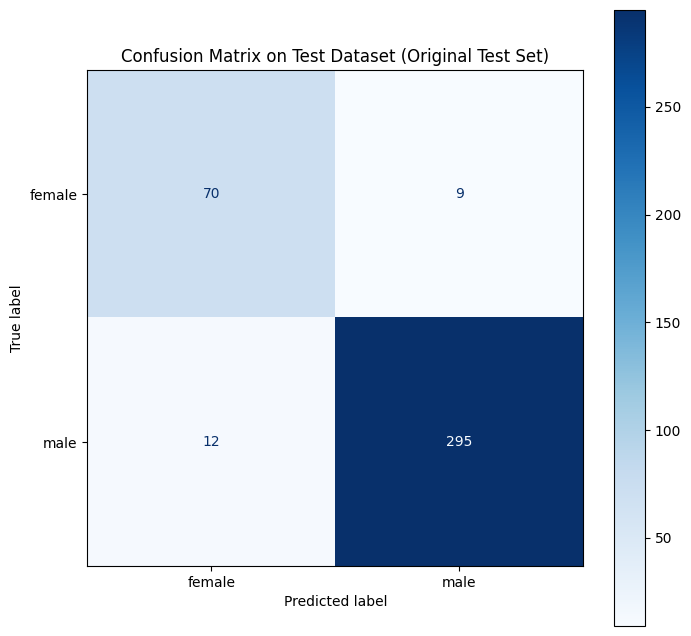


📊 Confusion Matrix Analysis:
True Negatives (Female→Female): 70
False Positives (Female→Male): 9
False Negatives (Male→Female): 12
True Positives (Male→Male): 295

🎯 Per-Class Accuracy:
Female Classification Accuracy: 0.8861 (88.61%)
Male Classification Accuracy: 0.9609 (96.09%)


In [20]:
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix
import matplotlib.pyplot as plt
import numpy as np

# Ensure labels and predictions are integers
true_labels = np.array(all_labels).astype(int)
predicted_labels = np.array(all_predictions).astype(int)

# Calculate the confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Get the class labels (assuming they are ordered alphabetically by ImageFolder)
class_names = test_dataset.classes # Assuming test_dataset is still available from previous cells

# Display the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
fig, ax = plt.subplots(figsize=(8, 8))
disp.plot(cmap=plt.cm.Blues, ax=ax)
plt.title('Confusion Matrix on Test Dataset (Original Test Set)')
plt.show()

# Print detailed confusion matrix analysis
print(f"\n📊 Confusion Matrix Analysis:")
print(f"True Negatives (Female→Female): {cm[0,0]}")
print(f"False Positives (Female→Male): {cm[0,1]}")
print(f"False Negatives (Male→Female): {cm[1,0]}")
print(f"True Positives (Male→Male): {cm[1,1]}")

# Calculate per-class accuracy
female_accuracy = cm[0,0] / (cm[0,0] + cm[0,1]) if (cm[0,0] + cm[0,1]) > 0 else 0
male_accuracy = cm[1,1] / (cm[1,0] + cm[1,1]) if (cm[1,0] + cm[1,1]) > 0 else 0

print(f"\n🎯 Per-Class Accuracy:")
print(f"Female Classification Accuracy: {female_accuracy:.4f} ({female_accuracy*100:.2f}%)")
print(f"Male Classification Accuracy: {male_accuracy:.4f} ({male_accuracy*100:.2f}%)")

**Reasoning**:
Plot the training and validation loss curves for both Phase 1 and Phase 2 training.



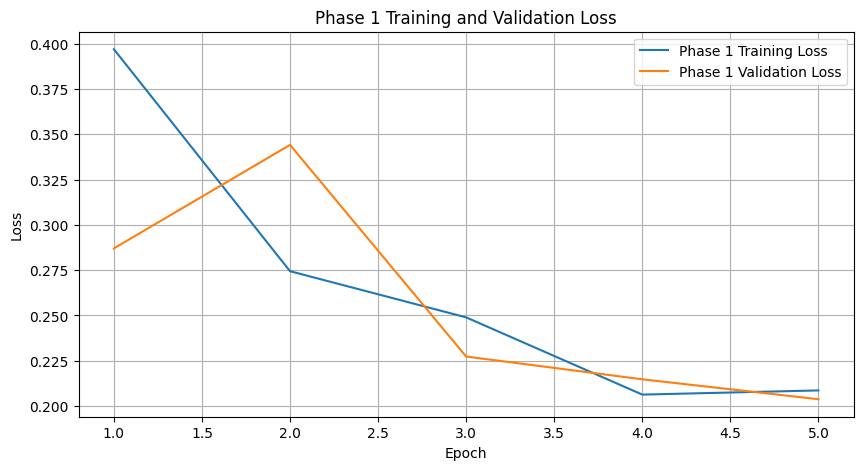

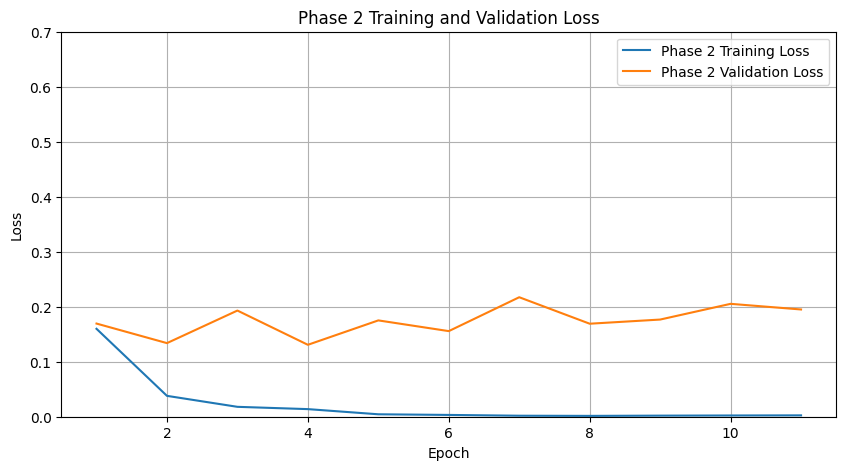

In [21]:
import matplotlib.pyplot as plt

# Plot Phase 1 Loss
plt.figure(figsize=(10, 5))
plt.plot(range(1, len(train_losses_phase1) + 1), train_losses_phase1, label='Phase 1 Training Loss')
plt.plot(range(1, len(val_losses_phase1) + 1), val_losses_phase1, label='Phase 1 Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Phase 1 Training and Validation Loss')
plt.legend()
plt.grid(True)
plt.show()

# Plot Phase 2 Loss
plt.figure(figsize=(10, 5))
plt.plot(range(1, len(train_losses_phase2) + 1), train_losses_phase2, label='Phase 2 Training Loss')
plt.plot(range(1, len(val_losses_phase2) + 1), val_losses_phase2, label='Phase 2 Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Phase 2 Training and Validation Loss')
plt.legend()
plt.grid(True)
plt.ylim(0, 0.70) # Set y-axis limits
plt.show()

In [29]:
import json
from datetime import datetime

print("="*80)
print("TASK A: GENDER CLASSIFICATION - FINAL SUMMARY")
print("="*80)

results_summary = {
    "task": "Task A - Gender Classification",
    "model_architecture": "ResNet50 with Binary Classification Head",
    "training_strategy": "Two-Phase Training (Head-only + Full Fine-tuning)",
    "dataset": "Augmented dataset with class balancing",
    "evaluation_date": datetime.now().strftime("%Y-%m-%d %H:%M:%S"),

    "training_metrics": {
        "accuracy": float(train_acc),
        "f1_score": float(train_f1),
        "precision": float(train_prec),
        "recall": float(train_rec),
        "loss": float(train_loss)
    },

    "validation_metrics": {
        "accuracy": float(val_acc),
        "f1_score": float(val_f1),
        "precision": float(val_prec),
        "recall": float(val_rec),
        "loss": float(val_loss)
    },

    "test_metrics": {
        "accuracy": float(test_acc),
        "f1_score": float(test_f1),
        "precision": float(test_prec),
        "recall": float(test_rec)
    },

    "model_generalization": {
        "train_val_accuracy_difference": float(abs(train_acc - val_acc)),
        "overfitting_status": "Good generalization" if abs(train_acc - val_acc) <= 0.05 else "Potential overfitting"
    },

    "confusion_matrix": {
        "true_negatives": int(cm[0,0]),
        "false_positives": int(cm[0,1]),
        "false_negatives": int(cm[1,0]),
        "true_positives": int(cm[1,1])
    },

    "per_class_accuracy": {
        "female_accuracy": float(female_accuracy),
        "male_accuracy": float(male_accuracy)
    }
}

with open('task_a_final_results.json', 'w') as f:
    json.dump(results_summary, f, indent=2)

# Display final summary
print(f"""
🎯 FINAL PERFORMANCE METRICS:

ACCURACY SCORES:
   • Training Accuracy:   {train_acc:.4f} ({train_acc*100:.2f}%)
   • Validation Accuracy: {val_acc:.4f} ({val_acc*100:.2f}%)
   • Test Accuracy:       {test_acc:.4f} ({test_acc*100:.2f}%)

F1 SCORES:
   • Training F1:   {train_f1:.4f}
   • Validation F1: {val_f1:.4f}
   • Test F1:       {test_f1:.4f}

PER-CLASS PERFORMANCE:
   • Female Classification: {female_accuracy:.4f} ({female_accuracy*100:.2f}%)
   • Male Classification:   {male_accuracy:.4f} ({male_accuracy*100:.2f}%)

 MODEL HEALTH:
   • Generalization Gap: {abs(train_acc - val_acc):.4f}
   • Status: {results_summary['model_generalization']['overfitting_status']}

 FILES GENERATED:
   best_model.pt (Model weights)
   task_a_final_results.json (Detailed metrics)
""")

print("="*80)
print("TASK A GENDER CLASSIFICATION COMPLETED SUCCESSFULLY!")
print("="*80)

TASK A: GENDER CLASSIFICATION - FINAL SUMMARY

🎯 FINAL PERFORMANCE METRICS:

ACCURACY SCORES:
   • Training Accuracy:   1.0000 (100.00%)
   • Validation Accuracy: 0.9502 (95.02%)
   • Test Accuracy:       0.9456 (94.56%)

F1 SCORES:
   • Training F1:   1.0000
   • Validation F1: 0.9674
   • Test F1:       0.9656

PER-CLASS PERFORMANCE:
   • Female Classification: 0.8861 (88.61%)
   • Male Classification:   0.9609 (96.09%)

 MODEL HEALTH:
   • Generalization Gap: 0.0498
   • Status: Good generalization

 FILES GENERATED:
   best_model.pt (Model weights)
   task_a_final_results.json (Detailed metrics)

TASK A GENDER CLASSIFICATION COMPLETED SUCCESSFULLY!


In [28]:

print("TASK A: GENDER CLASSIFICATION - QUICK RESULTS")
print("="*60)

try:
    # Load the saved results if available
    import json
    with open('task_a_final_results.json', 'r') as f:
        results = json.load(f)

    print(f"""
MODEL PERFORMANCE SUMMARY:

TEST SET RESULTS (Primary Metric):
   • Accuracy:  {results['test_metrics']['accuracy']:.4f} ({results['test_metrics']['accuracy']*100:.2f}%)
   • F1 Score:  {results['test_metrics']['f1_score']:.4f}
   • Precision: {results['test_metrics']['precision']:.4f}
   • Recall:    {results['test_metrics']['recall']:.4f}

TRAINING/VALIDATION COMPARISON:
   • Training Accuracy:   {results['training_metrics']['accuracy']:.4f} ({results['training_metrics']['accuracy']*100:.2f}%)
   • Validation Accuracy: {results['validation_metrics']['accuracy']:.4f} ({results['validation_metrics']['accuracy']*100:.2f}%)
   • Generalization Gap:   {results['model_generalization']['train_val_accuracy_difference']:.4f}

PER-CLASS ACCURACY:
   • Female: {results['per_class_accuracy']['female_accuracy']:.4f} ({results['per_class_accuracy']['female_accuracy']*100:.2f}%)
   • Male:   {results['per_class_accuracy']['male_accuracy']:.4f} ({results['per_class_accuracy']['male_accuracy']*100:.2f}%)

MODEL STATUS: {results['model_generalization']['overfitting_status']}
Evaluation Date: {results['evaluation_date']}
""")

except FileNotFoundError:
    print(" Results file not found. Please run the complete training pipeline first.")
    print(" Run all cells above to generate the complete evaluation results.")

print("="*60)
print(" Task A Evaluation Complete")
print("="*60)

TASK A: GENDER CLASSIFICATION - QUICK RESULTS

MODEL PERFORMANCE SUMMARY:

TEST SET RESULTS (Primary Metric):
   • Accuracy:  0.9456 (94.56%)
   • F1 Score:  0.9656
   • Precision: 0.9704
   • Recall:    0.9609

TRAINING/VALIDATION COMPARISON:
   • Training Accuracy:   1.0000 (100.00%)
   • Validation Accuracy: 0.9502 (95.02%)
   • Generalization Gap:   0.0498

PER-CLASS ACCURACY:
   • Female: 0.8861 (88.61%)
   • Male:   0.9609 (96.09%)

MODEL STATUS: Good generalization
Evaluation Date: 2025-07-04 18:41:10

 Task A Evaluation Complete
